<div style="display:block;width:100%;margin:auto;" direction=rtl align=center><br><br>
    <div  style="width:100%;margin:100;display:block;background-color:#fff0;"  display=block align=center>
        <table style="border-style:hidden;border-collapse:collapse;">
            <tr>
                <td  style="border: none!important;">
                    <img width=130 align=right src="https://i.ibb.co/yXKQmtZ/logo1.png" style="margin:0;" />
                </td>
                <td style="text-align:center;border: none!important;">
                    <h1 align=center><font size=5 color="skyblue">University of Tehran</i></font></h1>
                </td>
                <td style="border: none!important;">
                    <img width=170 align=left  src="https://i.ibb.co/wLjqFkw/logo2.png" style="margin:0;" />
                </td>
            </tr>
        </table>
    </div>
</div>

<h1 style = "color:orange;" dir = "ltr"> <b>
    Mahdi Naeeni
</b> </h1>

<h1 style = "color:orange;" dir = "ltr"> <b>
    SID: 810101536
</b> </h1>

<h1 style = "color:orange;" dir = "ltr"> <b>
    Mask Detection and Removal
</b> </h1>

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    Table of Contents
</b> </h1>

- [Introduction](#intro)

- [Utilizing Autoencoders and U-Net Models](#autoencoders)  

    - [Libraries](#auto_libraries)

    - [Mask removal - Part 1](#auto_mask)

    - [Exploring the Dataset and Preprocessing](#auto_exploring)

    - [Step 1: Autoencoder](#auto_step1)

    - [Step 2: U-Net 1](#auto_step2)

    - [Step 3: U-Net 2](#auto_step3)

- [Utilizing Diffusion Models](#diffusion)  

    - [Libraries](#dif_libraries)

    - [What is diffusion](#dif_explain)

    - [Text to Image](#dif_text)

    - [Image to Image](#dif_image)

    - [Inpainting](#dif_inpainting)

    - [Mask removal - Part 2](#dif_mask_removal)

- [References](#references)

<a id='intro'></a>

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    Introduction
</b> </h1>

Deep learning, a subset of machine learning, is at the heart of many recent advances in artificial intelligence. From self-driving cars to voice assistants and image recognition systems, deep learning powers a wide range of technologies by enabling machines to learn from vast amounts of data. Unlike traditional machine learning, deep learning utilizes artificial neural networks, which are inspired by the structure of the human brain, to identify patterns, make decisions, and improve over time.

In this notebook, We'll learn how to build, train, and evaluate models using popular libraries like TensorFlow and Keras. By the end of this course, we'll have a solid understanding of how to apply deep learning techniques to real-world tasks such as image segmentation, mask removal and more.

<a id='autoencoders'></a>

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    Utilizing Autoencoders and U-Net Models
</b> </h1>

<a id='auto_libraries'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Libraries:
</b> </h1>

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import keras
import tensorflow as tf
from tensorflow.keras import layers
from keras.preprocessing.image import img_to_array
from sklearn.model_selection import train_test_split
from google.colab import drive

<a id='auto_mask'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Mask removal - Part 1:
</b> </h1>

The Face-Mask-Lite Dataset is a lightweight collection of images specifically designed to address the challenges related to the identification and removal of facial masks in images. The dataset contains images of individuals both with and without masks, providing a balanced and diverse dataset for training models in mask detection, removal, or facial reconstruction tasks.

The dataset typically consists of images divided into two main categories:

- Masked Faces: 10000 Images of individuals wearing masks.

- Unmasked Faces: 10000 Images of individuals not wearing masks.

Using autoencoder for Mask Removal: The autoencoder architecture, can be adapted for the task of removing masks from facial images. autoencoder's encoder-decoder structure is well-suited for reconstructing images, as it captures contextual features in the encoding layers and reconstructs the images with added fine details in the decoding layers.

<a id='auto_exploring'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Exploring the Dataset and Preprocessing:
</b> </h1>

In [ ]:
!pip install kaggle

!kaggle datasets download prasoonkottarathil/face-mask-lite-dataset

!unzip face-mask-lite-dataset.zip -d face-mask-lite-dataset

Streaming output truncated to the last 5000 lines.
  inflating: face-mask-lite-dataset/without_mask/seed5000.png  
  inflating: face-mask-lite-dataset/without_mask/seed5001.png  
  inflating: face-mask-lite-dataset/without_mask/seed5002.png  
  inflating: face-mask-lite-dataset/without_mask/seed5003.png  
  inflating: face-mask-lite-dataset/without_mask/seed5004.png  
  inflating: face-mask-lite-dataset/without_mask/seed5005.png  
  inflating: face-mask-lite-dataset/without_mask/seed5006.png  
  inflating: face-mask-lite-dataset/without_mask/seed5007.png  
  inflating: face-mask-lite-dataset/without_mask/seed5008.png  
  inflating: face-mask-lite-dataset/without_mask/seed5009.png  
  inflating: face-mask-lite-dataset/without_mask/seed5010.png  
  inflating: face-mask-lite-dataset/without_mask/seed5011.png  
  inflating: face-mask-lite-dataset/without_mask/seed5012.png  
  inflating: face-mask-lite-dataset/without_mask/seed5013.png  
  inflating: face-mask-lite-dataset/without_mask/seed


In this part our purpose is to load, preprocess, and split image datasets for a machine learning task related to facial mask removal. The main function, `load_images` loads images from a specified directory, converts them from BGR to RGB, resizes them, normalizes the pixel values, and returns the images as NumPy arrays.

Our process will be in this shape:

1. Loading the dataset: Images with and without masks are loaded from different directories.

2. Image processing: Each image is resized to 160x160 pixels and normalized for model training.

3. Dataset splitting: The images are split into training, validation, and test sets using train_test_split

In [ ]:
def load_images(file_list, base_path, size, stop_file=None):
    images = []
    for image_num, filename in enumerate(tqdm(file_list, desc=f"Loading from {base_path}")):
        if image_num == stop_file:
            break

        img = cv2.imread(os.path.join(base_path, filename), cv2.IMREAD_COLOR)

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        img = cv2.resize(img, (size, size))

        img = img.astype('float32') / 255.0

        images.append(img_to_array(img))

    return np.array(images)

In [ ]:
path = '/content/face-mask-lite-dataset'
print("Available files:", os.listdir(path))

mask_path = '/content/face-mask-lite-dataset/with_mask'
image_path = '/content/face-mask-lite-dataset/without_mask'

mask_files = sorted(os.listdir(mask_path))
image_files = sorted(os.listdir(image_path))

IMAGE_SIZE = 160
number_of_images = 3000
mask_images = load_images(mask_files, mask_path, IMAGE_SIZE, stop_file= number_of_images)
no_mask_images = load_images(image_files, image_path, IMAGE_SIZE, stop_file=number_of_images)


x_train, x_test, y_train, y_test = train_test_split(mask_images, no_mask_images, test_size=0.2, random_state=42)
x_val, x_test, y_val, y_test = train_test_split(x_test, y_test, test_size=0.5, random_state=42)

print(f'Train shape: {x_train.shape}')
print(f'validation shape: {x_val.shape}')
print(f'Test no mask image shape: {x_test.shape}')

Available files: ['without_mask', 'with_mask']


Loading from /content/face-mask-lite-dataset/with_mask:  30%|███       | 3000/10000 [02:20<05:28, 21.32it/s]
Loading from /content/face-mask-lite-dataset/without_mask:  30%|███       | 3000/10000 [02:25<05:40, 20.58it/s]


Train shape: (2400, 160, 160, 3)
validation shape: (300, 160, 160, 3)
Test no mask image shape: (300, 160, 160, 3)


We visualize a set of images and their corresponding with masks images from a training dataset. It loops through the dataset, displaying three with/without mask pairs side by side using `matplotlib`.

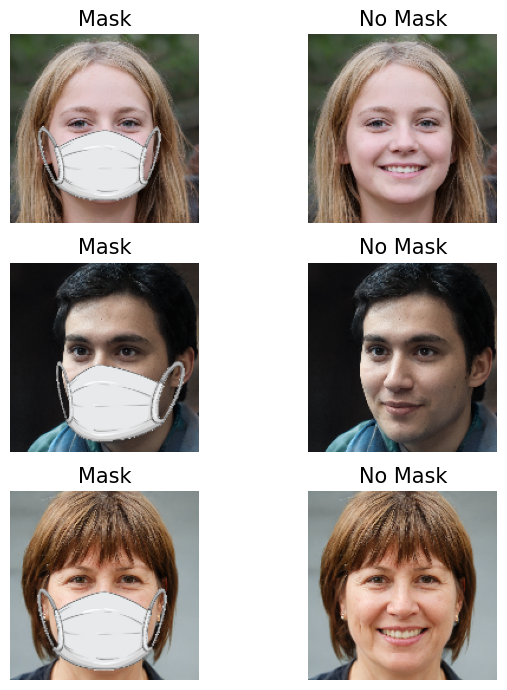

In [ ]:
number_sample = 3
fig, axes = plt.subplots(3, 2, figsize=(7, 7))
for i in range(number_sample):
    # Display mask
    axes[i, 0].imshow(x_train[i])
    axes[i, 0].set_title("Mask", fontsize=15)
    axes[i, 0].axis('off')

    # Display image
    axes[i, 1].imshow(y_train[i])
    axes[i, 1].set_title("No Mask", fontsize=15)
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

<a id='auto_step1'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Step 1(Autoencoder):
</b> </h1>


Now we define an autoencoder model using TensorFlow and Keras. The autoencoder consists of two parts:

1. Encoder: It takes an input image of shape (IMAGE_SIZE, IMAGE_SIZE, 3) and processes it through a series of convolutional layers, max-pooling, and batch normalization. The goal is to extract and compress key features of the input image. The encoder gradually increases the number of filters to create a compressed representation.

2. Decoder: The compressed features are passed through the decoder, which aims to reconstruct the original input image. The decoder uses upsampling layers and convolutional layers to progressively increase the spatial resolution, attempting to reverse the compression process and output an image similar to the input.

The final model is built by connecting the encoder and decoder, with the input image passed through both to create an output image of the same shape as the input.

In [ ]:
input_shape = (IMAGE_SIZE, IMAGE_SIZE, 3)
encoder_input = tf.keras.Input(shape= input_shape, name="img")
x = layers.Conv2D(filters = 16, kernel_size = (3,3), activation = 'relu', padding = 'same')(encoder_input)
x = layers.MaxPool2D(pool_size = (2,2))(x)
x = layers.Conv2D(filters = 32, kernel_size = (3,3), strides = (2,2), padding = 'valid')(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), activation = 'relu', padding = 'same')(x)
x = layers.MaxPool2D(pool_size = (2,2))(x)
x = layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'same')(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'same')(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(filters = 128 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = layers.Conv2D(filters = 256 , kernel_size = (3,3), padding = 'same')(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
encoder_output = layers.Conv2D(filters = 512 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x)


decoder_input = layers.Conv2D(filters = 512 ,kernel_size = (3,3), activation = 'relu', padding = 'same')(encoder_output)
x = layers.UpSampling2D(size = (2,2))(decoder_input)
x = layers.Conv2D(filters = 256, kernel_size = (3,3),  padding = 'same')(x)
x = layers.Dropout(0.2)(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(filters = 128, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = layers.Conv2D(filters = 128, kernel_size = (3,3),  padding = 'same')(x)
x = layers.Dropout(0.2)(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(filters = 164, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = layers.UpSampling2D(size = (2,2) )(x)
x = layers.Conv2D(filters = 64, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = layers.UpSampling2D(size = (2,2) )(x)
x = layers.Conv2D(filters = 32 , kernel_size = (3,3),  padding = 'same')(x)
x = layers.Dropout(0.2)(x)
x = layers.LeakyReLU()(x)
x = layers.UpSampling2D(size = (2,2) )(x)
x = layers.Conv2D(filters = 16  , kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
decoder_output = layers.Conv2D(filters = 3, kernel_size = (3,3), padding = 'same')(x)

# final model
model = tf.keras.Model(encoder_input, decoder_output)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ img (InputLayer)                     │ (None, 160, 160, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 160, 160, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 80, 80, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 39, 39, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 39, 39, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 39, 39, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 20, 20, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 10, 10, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 10, 10, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 10, 10, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 10, 10, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 10, 10, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 10, 10, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 10, 10, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 10, 10, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 10, 10, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 10, 10, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 10, 10, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 10, 10, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 6,048,679 (23.07 MB)

 Trainable params: 6,047,719 (23.07 MB)

 Non-trainable params: 960 (3.75 KB)

The model is compiled with the Adam optimizer using a learning rate of 0.001, with mean absolute error as the loss function and accuracy as a performance metric.

The model is then trained on the `train_dataset` for 100 epochs, with a progress display (verbose=2) and validation performed on the `validation_dataset`. The training `history` is stored in the history object.

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error', metrics = ['accuracy'])

history = model.fit(x_train, y_train, epochs = 100, verbose = 1, validation_data= (x_val, y_val))

Epoch 1/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - accuracy: 0.5304 - loss: 1.0199 - val_accuracy: 0.8690 - val_loss: 0.1725
Epoch 2/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - accuracy: 0.7962 - loss: 0.1216 - val_accuracy: 0.8764 - val_loss: 0.1771
Epoch 3/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8385 - loss: 0.1062 - val_accuracy: 0.8797 - val_loss: 0.1598
Epoch 4/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8504 - loss: 0.0906 - val_accuracy: 0.8819 - val_loss: 0.1396
Epoch 5/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - accuracy: 0.8571 - loss: 0.0824 - val_accuracy: 0.8820 - val_loss: 0.1043
Epoch 6/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - accuracy: 0.8473 - loss: 0.0790 - val_accuracy: 0.8815 - val_loss: 0.0826
Epoch 7/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - accuracy: 0.8435 - loss: 0.0766 - val_accuracy: 0.8787 - val_loss: 0.0722
Epoch 8/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - accuracy: 0.8487 - loss: 0.0714 - val_acc

The `save()` method serializes the model to a file.

The `load_model()` method deserializes the model from the file to continue using it.

In [ ]:
drive.mount('/content/drive')

# model.save('/content/drive/My Drive/mask_model.keras')

# model = tf.keras.models.load_model('/content/drive/My Drive/mask_model.keras')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Now we define a function `plot_acc_and_loss_history` that visualizes the accuracy and loss metrics for a model during its training and validation phases. It extracts the accuracy (acc, val_acc) and loss (loss, val_loss) from the training history object and plots these metrics over the course of the training epochs.

After defining the function, we evaluate the test dataset using `model.evaluate`, then we call the plotting function to display the performance trends.

In [ ]:
def plot_acc_and_loss_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = len(loss)
    epochs_range = range(epochs)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')
    plt.xticks(np.arange(0, epochs+1, 10))

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xticks(np.arange(0, epochs+1, 10))
    plt.tight_layout()
    plt.show()

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.9170 - loss: 0.0451


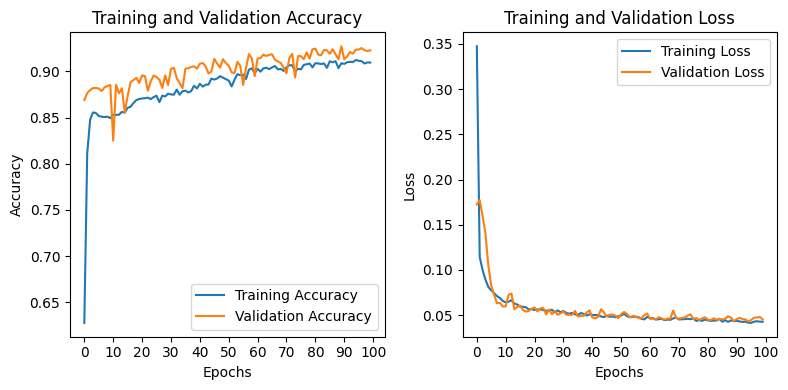

In [ ]:
model.evaluate(x_test, y_test)
plot_acc_and_loss_history(history)

After evaluating the test datase and plotting the accuracy and loss history we visualize the performance of a image reconstruction model, by displaying side-by-side comparisons of the input masks, the original images without masks, and the model's reconstructed outputs. it's providing an easy way to assess how well the model performs at reconstructing the input from the facial images with mask.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


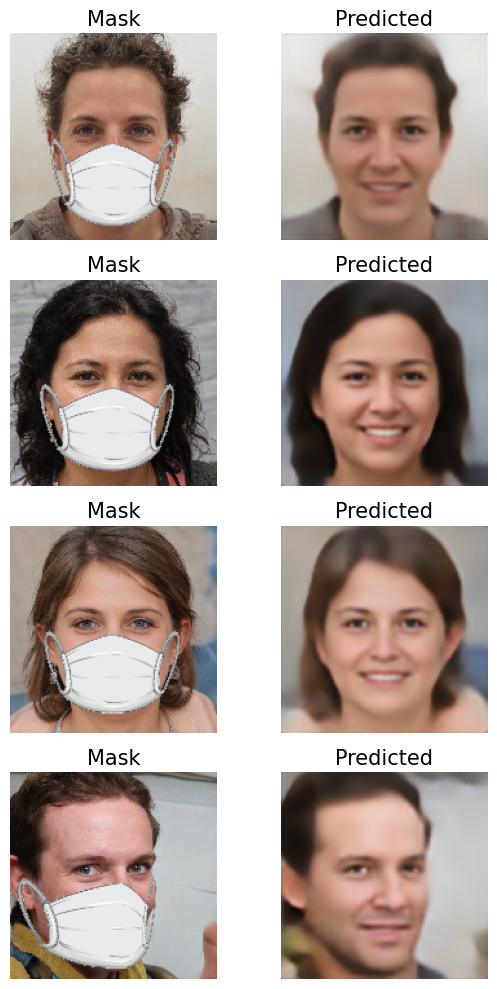

In [ ]:
number_samples = 4
predictions = model.predict(x_test[:number_samples])

fig, axes = plt.subplots(number_samples, 2, figsize=(6, 10))
for i in range(number_samples):
    # Display mask
    axes[i, 0].imshow(x_test[i])
    axes[i, 0].set_title("Mask", fontsize=15)
    axes[i, 0].axis('off')

    # Display image
    axes[i, 1].imshow(y_test[i])
    axes[i, 1].set_title("No Mask", fontsize=15)
    axes[i, 1].axis('off')

    # Display predicted
    axes[i, 1].imshow(predictions[i])
    axes[i, 1].set_title("Predicted", fontsize=15)
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


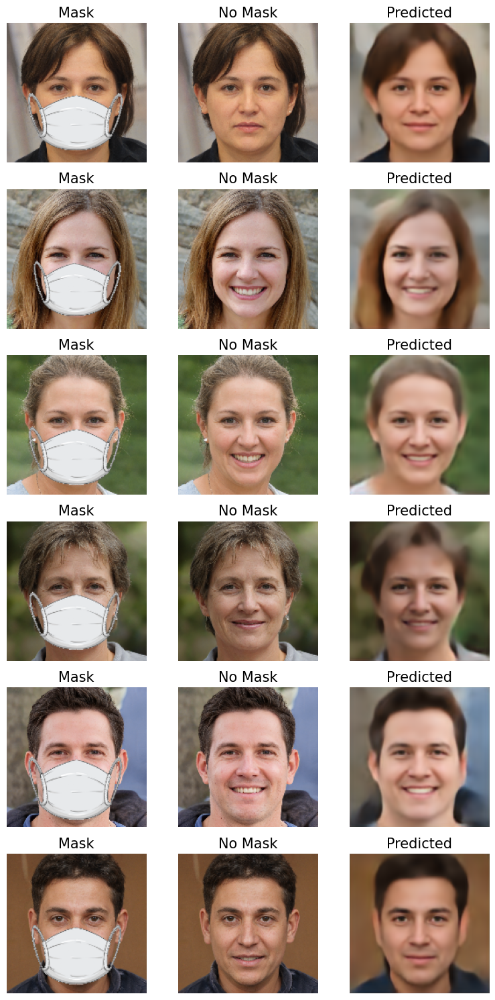

In [ ]:
begin_sample = 30
number_samples = 6
samples = x_test[begin_sample:number_samples+begin_sample]
true_images = y_test[begin_sample:number_samples+begin_sample]
predictions = model.predict(samples)

fig, axes = plt.subplots(number_samples, 3, figsize=(8, 15))
for i in range(number_samples):
    # Display mask
    axes[i, 0].imshow(samples[i])
    axes[i, 0].set_title("Mask", fontsize=15)
    axes[i, 0].axis('off')

    # Display image
    axes[i, 1].imshow(true_images[i])
    axes[i, 1].set_title("No Mask", fontsize=15)
    axes[i, 1].axis('off')

    # Display predicted
    axes[i, 2].imshow(predictions[i])
    axes[i, 2].set_title("Predicted", fontsize=15)
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

<a id='auto_step2'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Step 2(U-Net 1):
</b> </h1>

In this part we define a U-Net architecture tailored for the task of making images more clear. U-Net, originally developed for biomedical segmentation, has an encoder-decoder structure that captures features at multiple resolutions and reconstructs images in a symmetrical manner. The input to the model consists of masked facial images, while the output is the corresponding unmasked versions.

- Input: The input to the U-Net will be images of faces with masks.

- Conv block: Two convolutional layers with batch normalization, ReLU activation, and dropout for regularization.

- Encoder block: A convolutional block followed by max-pooling to downsample the feature maps.

- Bottleneck: The deepest layer in the U-Net that captures the most abstract features.

- Decoder block: Upsampling followed by concatenation with the corresponding encoder's skip connection, allowing the network to preserve fine details.

- Output layer: Produces the reconstructed, unmasked image.

The `build_unet` function assembles the model by combining the encoder, bottleneck, and decoder paths.


In [ ]:
def conv_block(input_tensor, num_filters):
    x = layers.Conv2D(num_filters, (3, 3), padding="same")(input_tensor)
    x = layers.ReLU()(x)
    x = layers.Conv2D(num_filters, (3, 3), padding="same")(x)
    x = layers.ReLU()(x)
    return x

def encoder_block(input_tensor, num_filters):
    x = conv_block(input_tensor, num_filters)
    p = layers.MaxPooling2D((2, 2))(x)
    return x, p

def decoder_block(input_tensor, skip_tensor, num_filters):
    x = layers.Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding="same")(input_tensor)
    x = layers.Concatenate()([x, skip_tensor])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = layers.Input(shape=input_shape)

    # Encoder path
    s1, p1 = encoder_block(inputs, 64)    
    s2, p2 = encoder_block(p1, 128)       
    s3, p3 = encoder_block(p2, 256)       
    s4, p4 = encoder_block(p3, 512)       

    # Bottleneck
    b = conv_block(p4, 1024)

    # Decoder path
    d1 = decoder_block(b, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    # Output layer
    outputs = layers.Conv2D(3, (1, 1), padding = 'same')(d4)

    model = tf.keras.Model(inputs, outputs)

    return model

input_shape = (IMAGE_SIZE, IMAGE_SIZE, 3)
model_unet = build_unet(input_shape)
model_unet.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 160, 160, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 160, 160, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 160, 160, 64)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 160, 160, 64)   │         36,928 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 160, 160, 64)   │              0 │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 80, 80, 64)     │              0 │ re_lu_1[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 80, 80, 128)    │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 80, 80, 128)    │              0 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 80, 80, 128)    │        147,584 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 80, 80, 128)    │              0 │ conv2d_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 40, 40, 128)    │              0 │ re_lu_3[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 40, 40, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_4 (ReLU)            │ (None, 40, 40, 256)    │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 40, 40, 256)    │        590,080 │ re_lu_4[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_5 (ReLU)            │ (None, 40, 40, 256)    │              0 │ conv2d_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 20, 20, 256)    │              0 │ re_lu_5[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 20, 20, 512)    │      1,180,160 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_6 (ReLU)            │ (None, 20, 20, 512)    │              0 │ conv2d_6[0][0]         │
├──────────────────────

 Total params: 31,031,875 (118.38 MB)

 Trainable params: 31,031,875 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

The model is compiled with the Adam optimizer using a learning rate of 0.001, with mean absolute error as the loss function and accuracy as a performance metric.

The model is then trained on the `train_dataset` for 50 epochs, with a progress display (verbose=2) and validation performed on the `validation_dataset`. The training `history` is stored in the history object.

In [ ]:
model_unet.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error', metrics = ['accuracy'])

pred_train = model.predict(x_train)
pred_val = model.predict(x_val)
history = model_unet.fit(pred_train, y_train, epochs = 20, verbose = 1, validation_data= (pred_val, y_val))

75/75 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step
Epoch 1/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 154s 1s/step - accuracy: 0.5479 - loss: 0.1669 - val_accuracy: 0.9082 - val_loss: 0.0463
Epoch 2/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 107s 680ms/step - accuracy: 0.9072 - loss: 0.0380 - val_accuracy: 0.9152 - val_loss: 0.0429
Epoch 3/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 677ms/step - accuracy: 0.9222 - loss: 0.0359 - val_accuracy: 0.9283 - val_loss: 0.0423
Epoch 4/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 679ms/step - accuracy: 0.9232 - loss: 0.0368 - val_accuracy: 0.9290 - val_loss: 0.0420
Epoch 5/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 681ms/step - accuracy: 0.9250 - loss: 0.0355 - val_accuracy: 0.9260 - val_loss: 0.0425
Epoch 6/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 681ms/step - accuracy: 0.9204 - loss: 0.0361 - val_accuracy: 0.9126 - val_loss: 0.0424
Epoch 7/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 683ms/step - accuracy: 0.9251 - loss: 0.0353 - val_accuracy: 0.9287 - val_loss: 0.0420
Epoch 8/20
75/75 ━

The `save()` method serializes the model to a file.

The `load_model()` method deserializes the model from the file to continue using it.

In [ ]:
drive.mount('/content/drive')

# model_unet.save('/content/drive/My Drive/unet_model.keras')

# model_unet = tf.keras.models.load_model('/content/drive/My Drive/unet_model.keras')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 174ms/step - accuracy: 0.9009 - loss: 0.0426


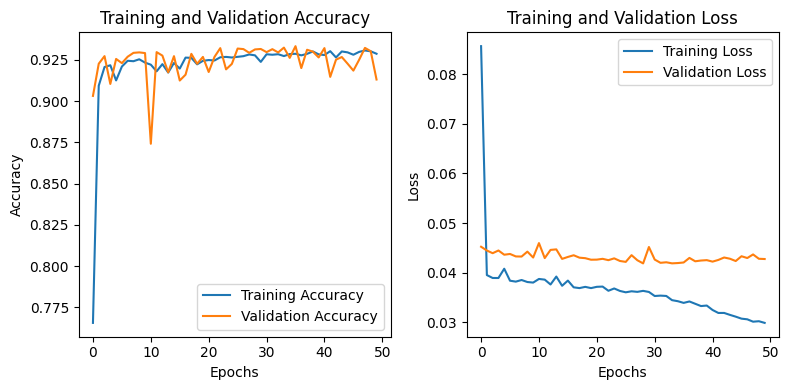

In [ ]:
predictions = model_unet.predict(x_test)
model_unet.evaluate(predictions, y_test)
plot_acc_and_loss_history(history)

After evaluating the test datase and plotting the accuracy and loss history we visualize the performance of a image reconstruction model, by displaying side-by-side comparisons of the input masks, the original images without masks, and the model's reconstructed outputs. it's providing an easy way to assess how well the model performs at reconstructing the input from the facial images with mask.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


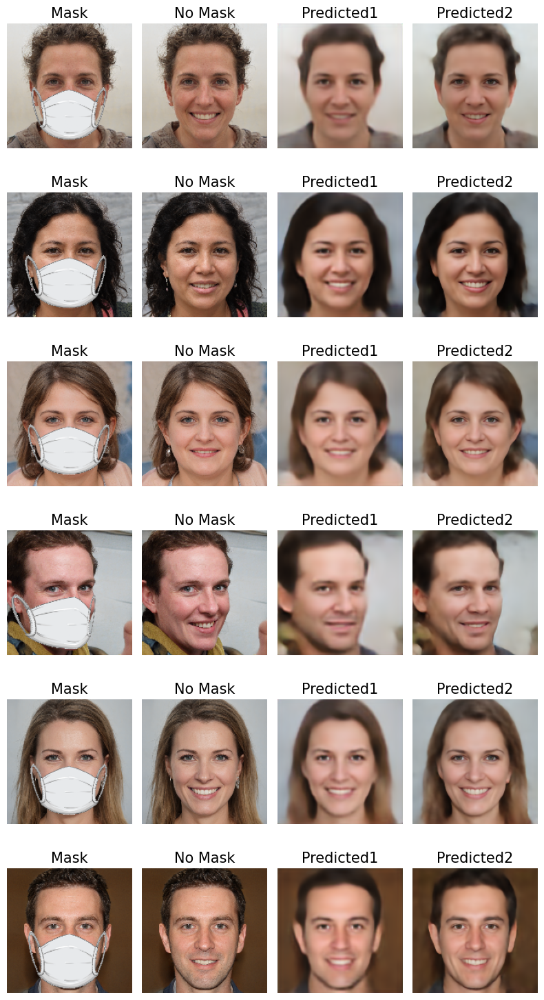

In [ ]:
number_samples = 6
predictions1 = model.predict(x_test[:number_samples])
predictions2 = model_unet.predict(predictions1)

fig, axes = plt.subplots(number_samples, 4, figsize=(8, 15))for i in range(number_samples):
    # Display mask
    axes[i, 0].imshow(x_test[i])
    axes[i, 0].set_title("Mask", fontsize=15)
    axes[i, 0].axis('off')

    # Display image
    axes[i, 1].imshow(y_test[i])
    axes[i, 1].set_title("No Mask", fontsize=15)
    axes[i, 1].axis('off')

    # Display predicted1
    axes[i, 2].imshow(predictions1[i])
    axes[i, 2].set_title("Predicted1", fontsize=15)
    axes[i, 2].axis('off')

    # Display predicted2
    axes[i, 3].imshow(predictions2[i])
    axes[i, 3].set_title("Predicted2", fontsize=15)
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


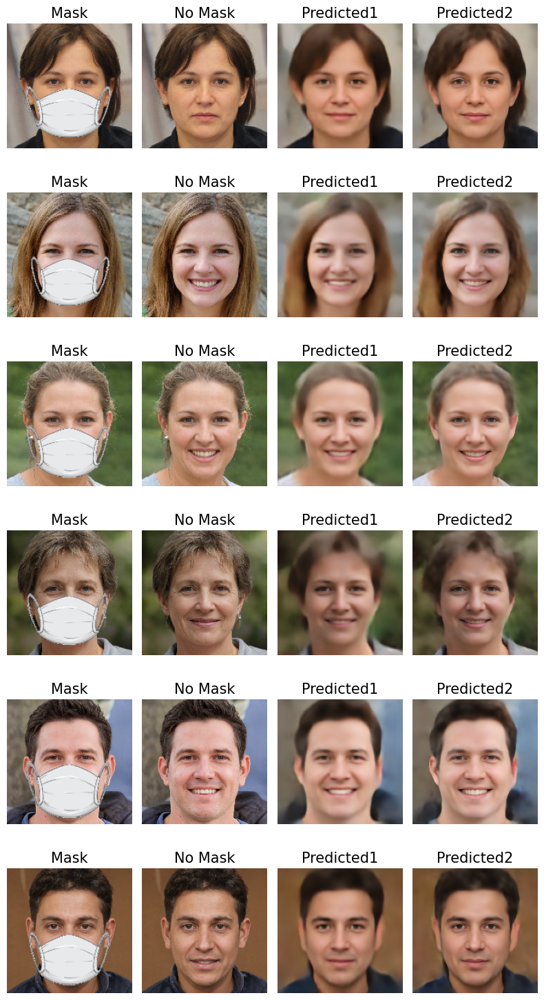

In [ ]:
begin_sample = 30
number_samples = 6
samples = x_test[begin_sample:number_samples+begin_sample]
true_images = y_test[begin_sample:number_samples+begin_sample]
predictions1 = model.predict(samples)

fig, axes = plt.subplots(number_samples, 4, figsize=(8, 15))
for i in range(number_samples):
    # Display mask
    axes[i, 0].imshow(samples[i])
    axes[i, 0].set_title("Mask", fontsize=15)
    axes[i, 0].axis('off')

    # Display image
    axes[i, 1].imshow(true_images[i])
    axes[i, 1].set_title("No Mask", fontsize=15)
    axes[i, 1].axis('off')

    # Display predicted1
    axes[i, 2].imshow(predictions1[i])
    axes[i, 2].set_title("Predicted1", fontsize=15)
    axes[i, 2].axis('off')

    # Display predicted2
    axes[i, 3].imshow(predictions2[i])
    axes[i, 3].set_title("Predicted2", fontsize=15)
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()

The `get_mask` function generates binary masks (`y_train`) by comparing a masked image (`with_mask`) with its unmasked counterpart (`without_mask`). It computes the absolute pixel difference to highlight the mask region, converts it to grayscale, and applies thresholding to create a binary mask. White areas in the mask indicate the mask region, while black areas represent the rest of the face. This binary mask is then used as ground truth for training the UNet model to detect mask regions.

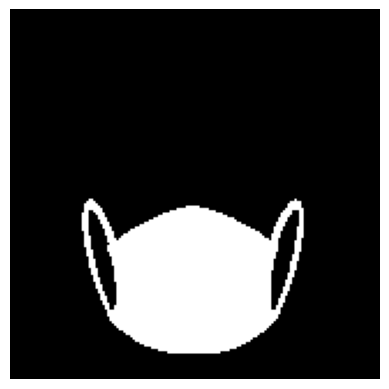

In [ ]:
def get_mask(with_mask, without_mask):
    difference = np.abs(without_mask - with_mask)
    gray_difference = cv2.cvtColor(difference, cv2.COLOR_BGR2GRAY)

    threshold_value = 0.01
    _, mask_image = cv2.threshold(gray_difference, threshold_value, 1, cv2.THRESH_BINARY)

    mask_image = mask_image.astype(np.uint8)
    return mask_image


with_mask = x_test[0]
without_mask = y_test[0]
mask_image = get_mask(with_mask, without_mask)

plt.imshow(mask_image, cmap='gray')
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


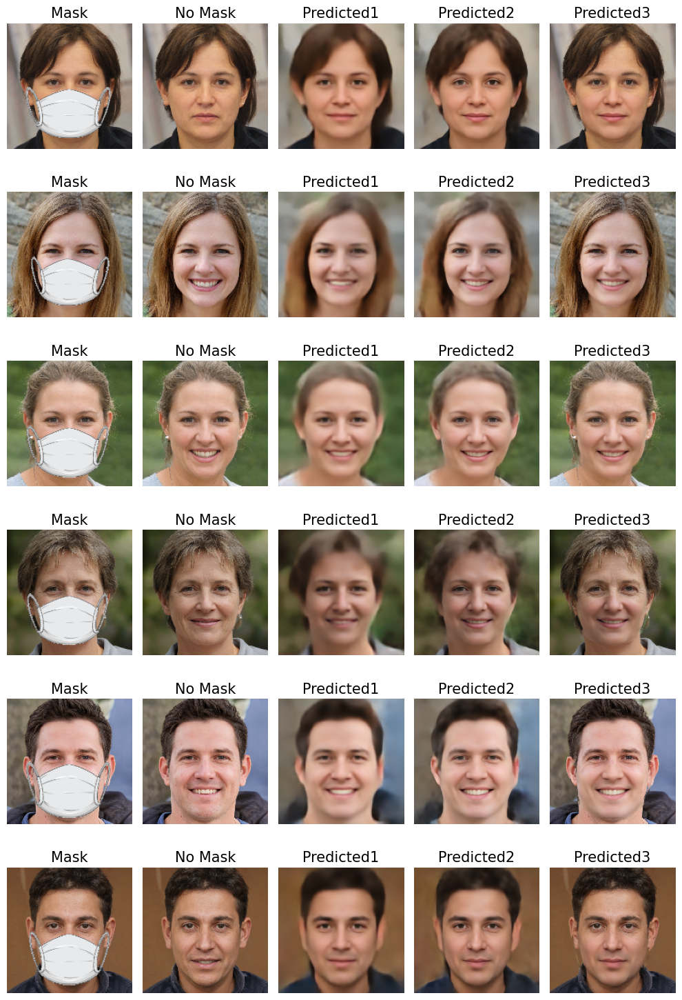

In [ ]:
begin_sample = 30
number_samples = 6
samples = x_test[begin_sample:number_samples+begin_sample]
true_images = y_test[begin_sample:number_samples+begin_sample]
predictions1 = model.predict(samples)
predictions2 = model_unet.predict(predictions1)

masks = np.array([get_mask(samples[i], true_images[i]) for i in range(number_samples)])
predictions3 = predictions2 * masks[..., None]  + samples * (1 - masks[..., None] )

fig, axes = plt.subplots(number_samples, 5, figsize=(10, 15))
for i in range(number_samples):
    # Display mask
    axes[i, 0].imshow(samples[i])
    axes[i, 0].set_title("Mask", fontsize=15)
    axes[i, 0].axis('off')

    # Display image
    axes[i, 1].imshow(true_images[i])
    axes[i, 1].set_title("No Mask", fontsize=15)
    axes[i, 1].axis('off')

    # Display predicted1
    axes[i, 2].imshow(predictions1[i])
    axes[i, 2].set_title("Predicted1", fontsize=15)
    axes[i, 2].axis('off')

    # Display predicted2
    axes[i, 3].imshow(predictions2[i])
    axes[i, 3].set_title("Predicted2", fontsize=15)
    axes[i, 3].axis('off')

    # Display predicted3
    axes[i, 4].imshow(predictions3[i])
    axes[i, 4].set_title("Predicted3", fontsize=15)
    axes[i, 4].axis('off')

plt.tight_layout()
plt.show()


<a id='auto_step3'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Step 3(U-Net 2):
</b> </h1>

In this part we define a U-Net architecture tailored for the task of making images more clear. U-Net, originally developed for biomedical segmentation, has an encoder-decoder structure that captures features at multiple resolutions and reconstructs images in a symmetrical manner. The input to the model consists of masked facial images, while the output is the corresponding unmasked versions.

- Input: The input to the U-Net will be images of faces with masks.

- Conv block: Two convolutional layers with batch normalization, ReLU activation, and dropout for regularization.

- Encoder block: A convolutional block followed by max-pooling to downsample the feature maps.

- Bottleneck: The deepest layer in the U-Net that captures the most abstract features.

- Decoder block: Upsampling followed by concatenation with the corresponding encoder's skip connection, allowing the network to preserve fine details.

- Output layer: Produces the reconstructed, unmasked image.

The `build_unet` function assembles the model by combining the encoder, bottleneck, and decoder paths.


In [ ]:
def conv_block(input_tensor, num_filters):
    x = layers.Conv2D(num_filters, (3, 3), padding="same")(input_tensor)
    x = layers.ReLU()(x)
    x = layers.Conv2D(num_filters, (3, 3), padding="same")(x)
    x = layers.ReLU()(x)
    return x

def encoder_block(input_tensor, num_filters):
    x = conv_block(input_tensor, num_filters)
    p = layers.MaxPooling2D((2, 2))(x)
    return x, p

def decoder_block(input_tensor, skip_tensor, num_filters):
    x = layers.Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding="same")(input_tensor)
    x = layers.Concatenate()([x, skip_tensor])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = layers.Input(shape=input_shape)

    # Encoder path
    s1, p1 = encoder_block(inputs, 64)    
    s2, p2 = encoder_block(p1, 128)       
    s3, p3 = encoder_block(p2, 256)       
    s4, p4 = encoder_block(p3, 512)       

    # Bottleneck
    b = conv_block(p4, 1024)

    # Decoder path
    d1 = decoder_block(b, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    # Output layer
    outputs = layers.Conv2D(3, (1, 1), padding = 'same')(d4)

    model = tf.keras.Model(inputs, outputs)

    return model

input_shape = (IMAGE_SIZE, IMAGE_SIZE, 3)
model_unet_2 = build_unet(input_shape)
model_unet_2.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 160, 160, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 160, 160, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 160, 160, 64)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 160, 160, 64)   │         36,928 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 160, 160, 64)   │              0 │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 80, 80, 64)     │              0 │ re_lu_1[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 80, 80, 128)    │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 80, 80, 128)    │              0 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 80, 80, 128)    │        147,584 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 80, 80, 128)    │              0 │ conv2d_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 40, 40, 128)    │              0 │ re_lu_3[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 40, 40, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_4 (ReLU)            │ (None, 40, 40, 256)    │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 40, 40, 256)    │        590,080 │ re_lu_4[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_5 (ReLU)            │ (None, 40, 40, 256)    │              0 │ conv2d_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 20, 20, 256)    │              0 │ re_lu_5[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 20, 20, 512)    │      1,180,160 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_6 (ReLU)            │ (None, 20, 20, 512)    │              0 │ conv2d_6[0][0]         │
├──────────────────────

 Total params: 31,031,875 (118.38 MB)

 Trainable params: 31,031,875 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

The model is compiled with the Adam optimizer using a learning rate of 0.001, with mean absolute error as the loss function and accuracy as a performance metric.

The model is then trained on the `train_dataset` for 50 epochs, with a progress display (verbose=2) and validation performed on the `validation_dataset`. The training `history` is stored in the history object.

In [ ]:
model_unet_2.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error', metrics = ['accuracy'])

predictions1_train = model.predict(x_train)
predictions2_train = model_unet.predict(predictions1_train)
masks = np.array([get_mask(x_train[i], y_train[i]) for i in range(len(x_train))])
pred_train = predictions2_train * masks[..., None]  + x_train * (1 - masks[..., None] )

predictions1_val = model.predict(x_val)
predictions2_val = model_unet.predict(predictions1_val)
masks = np.array([get_mask(x_val[i], y_val[i]) for i in range(len(x_val))])
pred_val = predictions2_val * masks[..., None]  + x_val * (1 - masks[..., None] )

history = model_unet_2.fit(pred_train, y_train, epochs = 10, verbose = 1, validation_data= (pred_val, y_val))

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 384ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step
Epoch 1/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 110s 674ms/step - accuracy: 0.7425 - loss: 0.1021 - val_accuracy: 0.9246 - val_loss: 0.0252
Epoch 2/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 88s 643ms/step - accuracy: 0.8951 - loss: 0.0265 - val_accuracy: 0.9192 - val_loss: 0.0286
Epoch 3/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 644ms/step - accuracy: 0.9081 - loss: 0.0243 - val_accuracy: 0.9497 - val_loss: 0.0194
Epoch 4/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 646ms/step - accuracy: 0.9254 - loss: 0.0213 - val_accuracy: 0.9507 - val_loss: 0.0218
Epoch 5/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 48s 641ms/step - accuracy: 0.9269 - loss: 0.0175 - val_accuracy: 0.9296 - val_loss: 0.0206
Epoch 6/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 645ms/step - accuracy: 0.9331 - loss: 0.0185 - val_accuracy: 0.9637 - val_loss: 0.0157
Epoch 7/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 646ms/step - accuracy: 0.9490 - loss: 0.0155 - val_accuracy: 0.9503 - val_loss: 0.0212
Epoch 8/10
75/75

The `save()` method serializes the model to a file.

The `load_model()` method deserializes the model from the file to continue using it.

In [ ]:
drive.mount('/content/drive')

# model_unet_2.save('/content/drive/My Drive/unet_model_2.keras')

# model_unet_2 = tf.keras.models.load_model('/content/drive/My Drive/unet_model_2.keras')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.7805 - loss: 0.0659


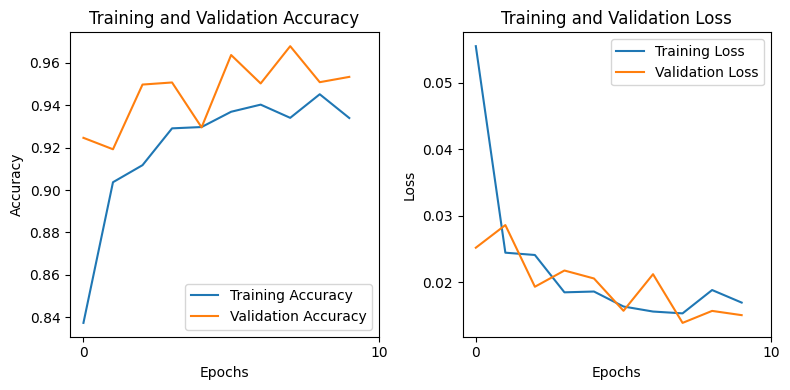

In [ ]:
predictions = model_unet_2.predict(x_test)
model_unet_2.evaluate(predictions, y_test)
plot_acc_and_loss_history(history)

After evaluating the test datase and plotting the accuracy and loss history we visualize the performance of a image reconstruction model, by displaying side-by-side comparisons of the input masks, the original images without masks, and the model's reconstructed outputs. it's providing an easy way to assess how well the model performs at reconstructing the input from the facial images with mask.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


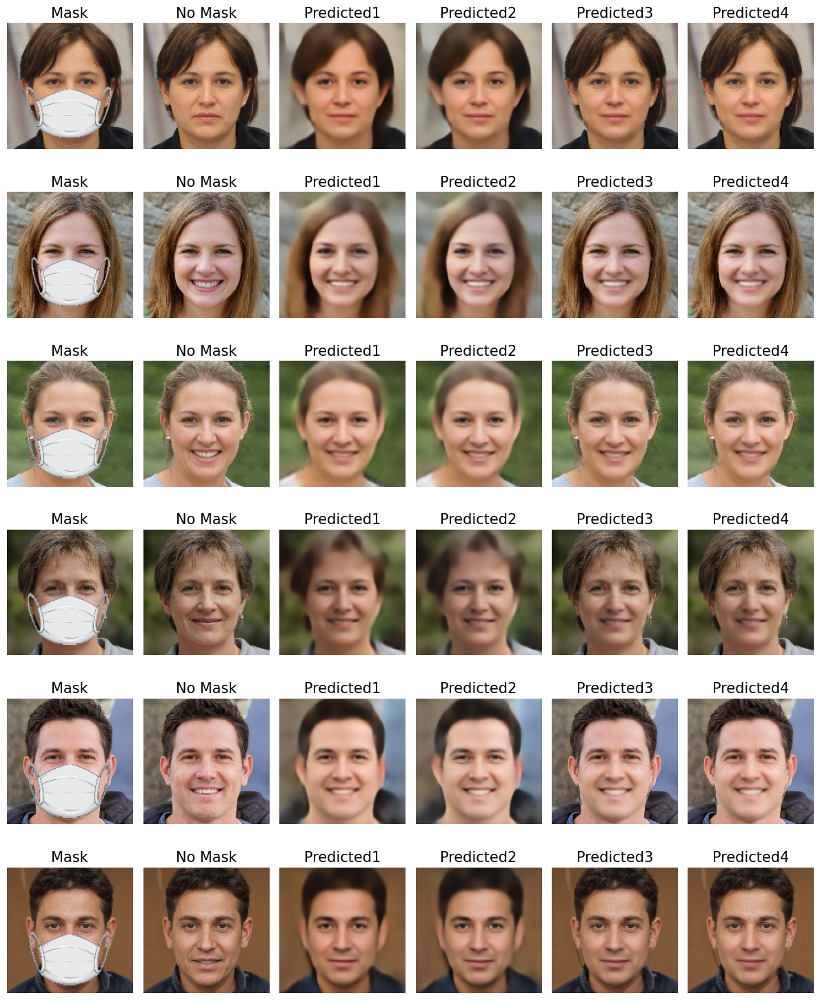

In [ ]:
begin_sample = 30
number_samples = 6
samples = x_test[begin_sample:number_samples+begin_sample]
true_images = y_test[begin_sample:number_samples+begin_sample]
predictions1 = model.predict(samples)
predictions2 = model_unet.predict(predictions1)

masks = np.array([get_mask(samples[i], true_images[i]) for i in range(number_samples)])
predictions3 = predictions2 * masks[..., None]  + samples * (1 - masks[..., None] )

predictions4 = model_unet_2.predict(predictions3)

fig, axes = plt.subplots(number_samples, 6, figsize=(12, 15))
for i in range(number_samples):
    # Display mask
    axes[i, 0].imshow(samples[i])
    axes[i, 0].set_title("Mask", fontsize=15)
    axes[i, 0].axis('off')

    # Display image
    axes[i, 1].imshow(true_images[i])
    axes[i, 1].set_title("No Mask", fontsize=15)
    axes[i, 1].axis('off')

    # Display predicted1
    axes[i, 2].imshow(predictions1[i])
    axes[i, 2].set_title("Predicted1", fontsize=15)
    axes[i, 2].axis('off')

    # Display predicted2
    axes[i, 3].imshow(predictions2[i])
    axes[i, 3].set_title("Predicted2", fontsize=15)
    axes[i, 3].axis('off')

    # Display predicted3
    axes[i, 4].imshow(predictions3[i])
    axes[i, 4].set_title("Predicted3", fontsize=15)
    axes[i, 4].axis('off')

    # Display predicted4
    axes[i, 5].imshow(predictions4[i])
    axes[i, 5].set_title("Predicted4", fontsize=15)
    axes[i, 5].axis('off')

plt.tight_layout()
plt.show()


<a id='diffusion'></a>

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    Utilizing Diffusion Models
</b> </h1>

<a id='dif_libraries'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Libraries:
</b> </h1>


In this section, we'll explore the concept of Diffusion and delve into the process of generating images from text using Stable Diffusion. Diffusion models gradually transform random noise into coherent images through a sequence of steps, guided by underlying patterns in the data. We'll begin by understanding the core principles of diffusion, then move on to how Stable Diffusion leverages these concepts to generate high-quality images based on textual descriptions. By the end, you'll have a clear understanding of how text-to-image models work and the role diffusion plays in creating detailed visual outputs.

In [ ]:
!pip install diffusers

if you're using a specific version of Python or need a GPU-supported version, you can ensure that the correct dependencies are installed with:

In [ ]:
!pip install diffusers[torch]

In [ ]:
import os
import cv2
import torch
import requests
import numpy as np
from tqdm import tqdm
from io import BytesIO
from IPython import display
import matplotlib.pyplot as plt
from IPython.display import Video
from PIL import Image, ImageFilter
from diffusers import ControlNetModel
from diffusers import I2VGenXLPipeline
from diffusers import StableDiffusionPipeline
from diffusers import AutoPipelineForInpainting
from diffusers import AutoPipelineForImage2Image
from diffusers import StableVideoDiffusionPipeline
from diffusers import StableDiffusionInpaintPipeline
from diffusers.utils import load_image, make_image_grid, export_to_video, export_to_gif
from keras.preprocessing.image import img_to_array

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

<a id='dif_explain'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    What is Diffusion:
</b> </h1>

Diffusion, in the context of machine learning and generative models, refers to a process where data (such as an image) is gradually transformed by adding noise in small steps, and then a reverse process is applied to remove that noise and reconstruct the original data.

This is how diffusion works:

1. Forward Diffusion Process: Starting with a clean image, small amounts of noise are added over many steps, eventually turning the image into pure noise. This simulates a degradation process, where the image becomes unrecognizable.

2. Reverse Diffusion Process: The goal of the diffusion model is to learn how to reverse this process — starting from random noise and gradually refining it step by step, recovering the original image or generating a new image that matches a desired target.

3. Training: The model is trained to predict the noise that was added at each step of the forward process. Once trained, it can run in reverse to generate data (like images) from random noise.

<img width=700 height=200 src="https://images.prismic.io/encord/334e0c7d-17db-4162-931a-246a34fe9cd4_image10.png?auto=compress,format" align=center>

In generative applications, especially text-to-image models like Stable Diffusion, the reverse process is crucial. Given a text prompt, the model generates random noise and then progressively refines it, guided by the features of the prompt, until it outputs a detailed image matching the description.

<img width=700 height=300 src="https://lilianweng.github.io/posts/2021-07-11-diffusion-models/unCLIP.png" align=center>

Diffusion models are powerful because they avoid some of the challenges seen in other generative models (like GANs), such as training instability, and they can produce high-quality and diverse results.

If you want to learn more about diffusion, you can visit [The recent rise of diffusion models](https://deepsense.ai/the-recent-rise-of-diffusion-based-models/) and [What are Diffusion Models?](https://lilianweng.github.io/posts/2021-07-11-diffusion-models/)

<a id='dif_text'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Text to Image:
</b> </h1>


In this code, we're loading a pre-trained Stable Diffusion model using the `StableDiffusionPipeline` from Hugging Face's `diffusers` library. The model is retrieved from the `"CompVis/stable-diffusion-v1-4"` repository, and the `torch_dtype=torch.float16` argument optimizes memory usage by using 16-bit precision. We also move the pipeline to a GPU (`'cuda'`) for faster computation and inference.

Stable Diffusion is a powerful text-to-image model that generates high-quality images by applying diffusion processes, transforming random noise into coherent images based on textual input. This process allows for creative and detailed visual generation.

In [ ]:
pipeline = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)
pipeline = pipeline.to('cuda')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


This function, `show_images_grid`, displays a grid of images in a specified number of rows and columns. It takes in a list of images and arranges them in a grid, turning off the axes for a cleaner presentation. The grid's size is determined by the number of rows and columns, with each image displayed in a subplot of the defined figure size.

In [ ]:
def show_images_grid(images, rows, cols):
    figsize = (3*cols, 3*rows)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i])
        ax.axis('off')

    plt.tight_layout()
    plt.show()


In this code, we are generating six images based on the prompt. The `prompt` list contains the same text repeated six times, one for each image. The `pipeline` uses the Stable Diffusion model to create the images based on this prompt, and the generated images are stored in the `images` variable. Finally, the `show_images_grid` function displays these images in a grid layout with 2 rows and 3 columns.

  0%|          | 0/50 [00:00<?, ?it/s]

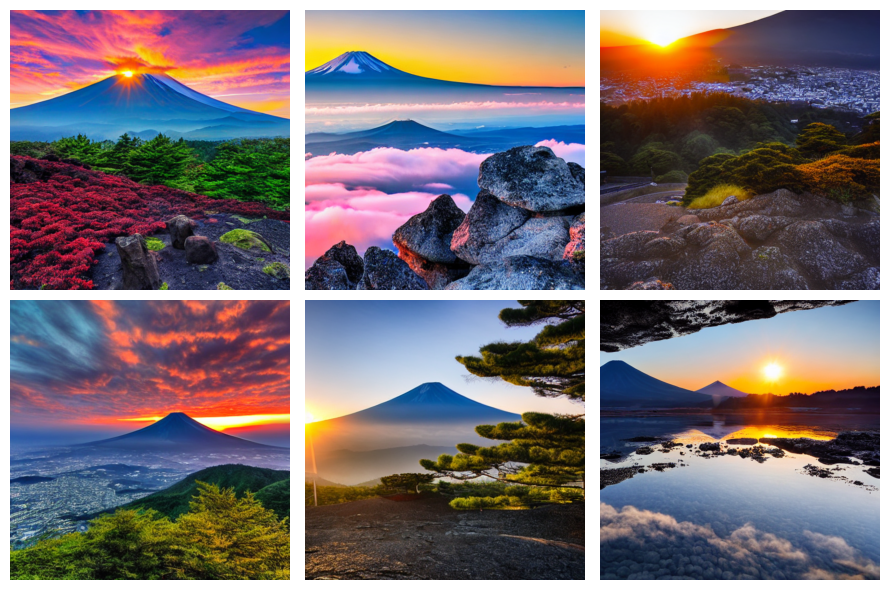

In [ ]:
num_images = 6
prompt = ["Sunrise in fuji mountain"] * num_images

images = pipeline(prompt).images
show_images_grid(images, rows= 2, cols= 3)

  0%|          | 0/50 [00:00<?, ?it/s]

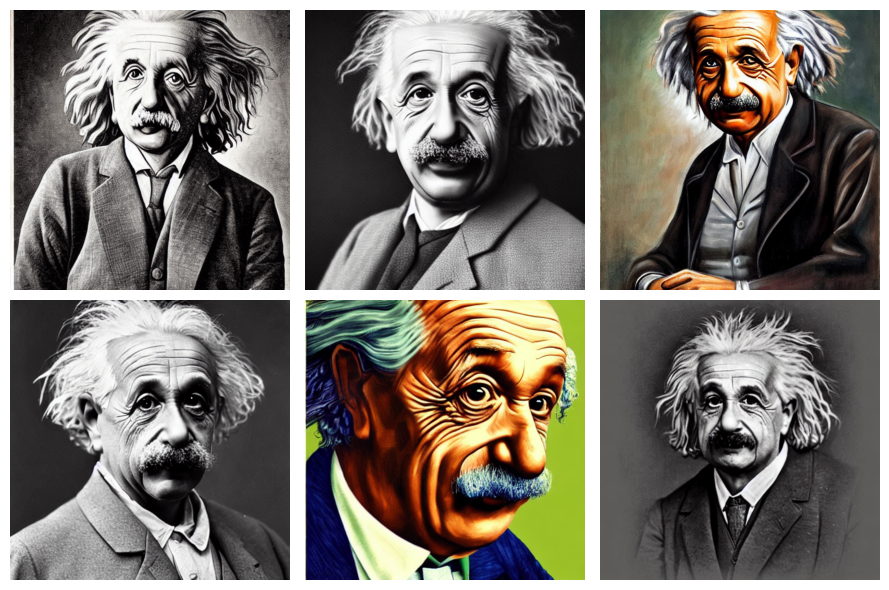

In [ ]:
num_images = 6
prompt = ['a realistic portrait of albert einstein with a bewildered expressions'] * num_images

images = pipeline(prompt).images
show_images_grid(images, rows= 2, cols= 3)

<a id='dif_image'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Image to Image:
</b> </h1>

Image-to-Image Transformation refers to the process of generating or modifying images by taking another image as input. This can involve tasks like style transfer, super-resolution, colorization, or more complex transformations where the input image is altered based on learned patterns, often through deep learning models.

In this part we are setting up an image-to-image transformation pipeline using Hugging Face's transformers library and the Kandinsky 2.2 model, which is designed for tasks like image generation and transformation.

`torch_dtype=torch.float16` Specifies that the model should use 16-bit floating-point precision, which reduces memory usage and can speed up computations on compatible hardware.`use_safetensors=True` Indicates that the model will load in a safer, faster, and more efficient format called safetensors and finally `pipeline.to('cuda')` Moves the pipeline to a GPU (CUDA), which accelerates the image processing by utilizing GPU resources.

In [ ]:
pipeline = AutoPipelineForImage2Image.from_pretrained("kandinsky-community/kandinsky-2-2-decoder", torch_dtype=torch.float16, use_safetensors=True)
pipeline = pipeline.to('cuda')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/250 [00:00<?, ?B/s]

Fetching 7 files:   0%|          | 0/7 [00:00<?, ?it/s]

README.md:   0%|          | 0.00/7.34k [00:00<?, ?B/s]

movq/config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/271M [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/317 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.01G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.67k [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

model_index.json:   0%|          | 0.00/501 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

image_encoder/config.json:   0%|          | 0.00/2.01k [00:00<?, ?B/s]

image_processor/preprocessor_config.json:   0%|          | 0.00/315 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/4.10G [00:00<?, ?B/s]

prior/config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/2.02k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.69G [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


This function, `show_images_grid`, displays a grid of images in a specified number of rows and columns. It takes in a list of images and arranges them in a grid, turning off the axes for a cleaner presentation. The grid's size is determined by the number of rows and columns, with each image displayed in a subplot of the defined figure size.

In [ ]:
def show_images_grid(images, rows, cols):
    figsize = (3*cols, 3*rows)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i])
        ax.axis('off')

    plt.tight_layout()
    plt.show()

We use a diffusion-based image generation pipeline from the Hugging Face `diffusers` library, to generate images based on an initial input image and a textual prompt. It retrieves a base image from the web, resizes it, and then generates new images using the `pipeline` function, guided by a textual prompt. The generated images are then displayed in a grid along with the initial image.

`strength` is one of the most important parameters to consider and it'll have a huge impact on our generated image. It determines how much the generated image resembles the initial image. In other words a higher `strength` value gives the model more “creativity” to generate an image that's different from the initial image; a `strength` value of 1.0 means the initial image is more or less ignored.a lower `strength` value means the generated image is more similar to the initial image.

The `guidance_scale` parameter is used to control how closely aligned the generated image and text prompt are. A higher `guidance_scale` value means our generated image is more aligned with the prompt, while a lower `guidance_scale` value means our generated image has more space to deviate from the prompt.

We can combine `guidance_scale` with `strength` for even more precise control over how expressive the model is. For example, combine a high `strength + guidance_scale` for maximum creativity or use a combination of low `strength` and low `guidance_scale` to generate an image that resembles the initial image but is not as strictly bound to the prompt.


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

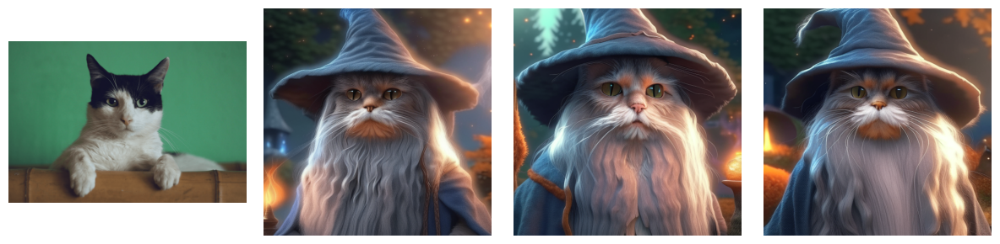

In [ ]:
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
init_image = load_image(url)
init_image = init_image.resize((512, 350))

number_of_images = 3
prompt = ["cat wizard, gandalf, lord of the rings, detailed, fantasy, cute, adorable, Pixar, Disney, 8k"] * number_of_images
images = pipeline(prompt=prompt, image=init_image, strength=1.0, guidance_scale=10.0).images

all_images = [init_image]
all_images.extend(images)
show_images_grid(all_images, rows=1, cols=4)

Now we set up a ControlNet model for generating images based on depth information using the Stable Diffusion model. WE load the pre-trained "control_v11f1p_sd15_depth" ControlNet model and integrate it with the Stable Diffusion image-to-image pipeline from "runwayml/stable-diffusion-v1-5." The models are loaded in half-precision (fp16) format with safety tensors enabled, and the processing is optimized to run on a CUDA-enabled GPU for faster computation.

"generating images based on depth information" means that the model uses a depth map (a representation of how far each pixel is from the camera) as an additional input to guide the image generation process. ControlNet is a neural network extension for Stable Diffusion that allows more control over the output by using additional information, such as depth, which helps the model better understand the structure of the scene in three dimensions. In short, the depth data helps the model generate images that better capture the 3D structure of a scene, resulting in more realistic outputs when transforming or generating images.







In [ ]:
controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11f1p_sd15_depth", torch_dtype=torch.float16, variant="fp16", use_safetensors=True)
pipeline = AutoPipelineForImage2Image.from_pretrained("runwayml/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16, variant="fp16", use_safetensors=True)
pipeline = pipeline.to('cuda')

config.json:   0%|          | 0.00/945 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/723M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Now we use Hugging Face's diffusers library to generate images based on a prompt and input images, guided by depth data. First we fetche an initial image from a URL, resizes it, and also loads a depth image used to guide the image generation process.then A text prompt ("Astronaut in a jungle, cold color palette, muted colors, detailed, 8k") is repeated three times to generate three images.After this The Stable Diffusion pipeline is used to generate images based on the prompt, the initial image, and the depth map, with parameters that control how much the model should follow the prompt and the depth image are passed to the function. Finally, the initial, depth, and generated images are displayed in a grid for comparison.

  0%|          | 0/40 [00:00<?, ?it/s]

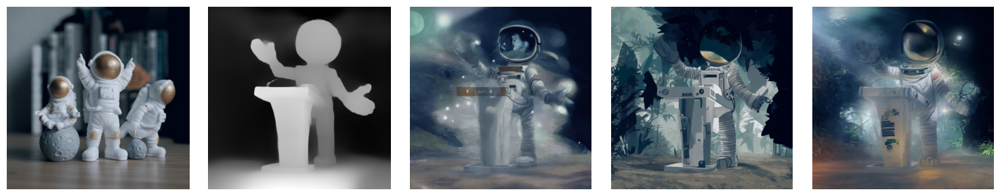

In [ ]:
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-init.png"
init_image = load_image(url)
init_image = init_image.resize((958, 960))
depth_image = load_image("https://huggingface.co/lllyasviel/control_v11f1p_sd15_depth/resolve/main/images/control.png")

number_of_images = 3
prompt = ["Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"] * number_of_images
image_control_net = pipeline(prompt, image=init_image, control_image=depth_image, trength=0.7, guidance_scale=10).images

all_images = [init_image, depth_image]
all_images.extend(image_control_net)
show_images_grid(all_images, rows=1, cols=5)

<a id='dif_inpainting'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Inpainting:
</b> </h1>

Inpainting is a technique used in image processing to fill in missing or damaged parts of an image. The goal is to reconstruct the image by predicting the content in the missing regions in a way that is coherent with the surrounding areas. This can be useful in photo restoration, removing unwanted objects, or completing images in creative ways.

In this part we use Kandinsky 2.2, a model from the kandinsky-community repository, specifically for inpainting tasks

`AutoPipelineForInpainting.from_pretrained` loads a pre-trained inpainting pipeline, which uses Kandinsky 2.2 decoder for generating the inpainted content.

`torch_dtype=torch.float16` optimizes the model by using half-precision floating point operations, reducing memory usage.

The line `pipeline.to('cuda')` moves the pipeline to the GPU to leverage CUDA for faster computations.

In [ ]:
pipeline = AutoPipelineForInpainting.from_pretrained("kandinsky-community/kandinsky-2-2-decoder-inpaint", torch_dtype=torch.float16)
pipeline = pipeline.to('cuda')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/257 [00:00<?, ?B/s]

Fetching 7 files:   0%|          | 0/7 [00:00<?, ?it/s]

README.md:   0%|          | 0.00/5.72k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.01G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/318 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.67k [00:00<?, ?B/s]

movq/config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/271M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

model_index.json:   0%|          | 0.00/501 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

image_processor/preprocessor_config.json:   0%|          | 0.00/315 [00:00<?, ?B/s]

image_encoder/config.json:   0%|          | 0.00/2.01k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

prior/config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/4.10G [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/2.02k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.69G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


This function, `show_images_grid`, displays a grid of images in a specified number of rows and columns. It takes in a list of images and arranges them in a grid, turning off the axes for a cleaner presentation. The grid's size is determined by the number of rows and columns, with each image displayed in a subplot of the defined figure size.

In [ ]:
def show_images_grid(images, rows, cols):
    figsize = (3*cols, 3*rows)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i])
        ax.axis('off')

    plt.tight_layout()
    plt.show()

Now we demonstrate a basic preprocessing step for inpainting, where a mask is loaded and blurred before applying further image inpainting techniques. At first we load an image (in this case, a mask) from a URL, apply a GaussianBlur filter with a radius of 33 to it, and then we use `show_images_grid()` to display the original and blurred images side by side in a grid.



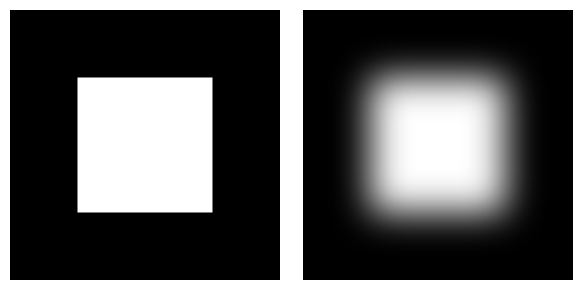

In [ ]:
mask_url = "https://huggingface.co/datasets/YiYiXu/testing-images/resolve/main/seashore_mask.png"
mask = load_image(mask_url)

blurred_mask = mask.filter(ImageFilter.GaussianBlur(33))

show_images_grid([mask, blurred_mask], rows=1, cols=2)

In this part we demonstrate the use of an inpainting pipeline with the Hugging Face `diffusers` library and PyTorch for generating AI-enhanced images. The script first loads an initial image (`init_image`) and a mask image (`mask_image`) from URLs. It sets a random seed for reproducibility on a CUDA-enabled device and defines prompts for generating concept art of a highly detailed gray castle, with specific prompts and negative prompts to guide the model's output. It then runs the pipeline to generate four images, blending the prompt, initial image, and mask. Finally, it displays the original images and the generated ones in a grid layout

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

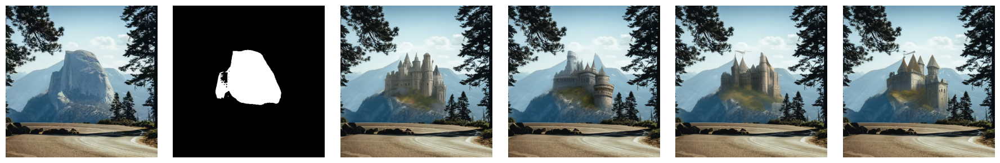

In [ ]:
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

generator = torch.Generator("cuda").manual_seed(92)
number_of_images = 4
prompt = ["concept art digital painting of a gray castle, inspired by lord of the rings, highly detailed, 8k"] * number_of_images
negative_prompt = ["bad architecture, unstable, poor details, blurry"] * number_of_images
images = pipeline(prompt=prompt, image=init_image, mask_image=mask_image, generator=generator, strength=0.8, guidance_scale=2.5).images

all_images = [init_image, mask_image]
all_images.extend(images)
show_images_grid(all_images, rows=1, cols=6)

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

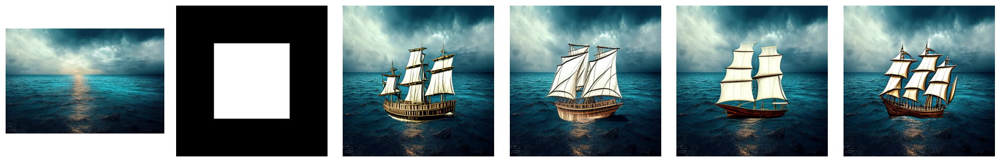

In [ ]:
init_image = load_image("https://www.shutterstock.com/image-photo/calm-weather-on-sea-ocean-600nw-2212935531.jpg")
mask_image = load_image("https://huggingface.co/datasets/YiYiXu/testing-images/resolve/main/seashore_mask.png")

generator = torch.Generator("cuda").manual_seed(92)
number_of_images = 4
prompt = [
    "Highly detailed concept of realistic wooden ship sailing on the open ocean. The ship features tall, weathered sails billowing in the wind and cannons visible."
] * number_of_images

negative_prompt = ["poor details, blurry"] * number_of_images
images = pipeline(prompt=prompt, negative_prompt=negative_prompt, image=init_image, mask_image=mask_image, generator=generator, strength=0.8, guidance_scale=2.5).images

all_images = [init_image, mask_image]
all_images.extend(images)
show_images_grid(all_images, rows=1, cols=6)

<a id='dif_mask_removal'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Mask removal - Part 2:
</b> </h1>

The Face-Mask-Lite Dataset is a lightweight collection of images specifically designed to address the challenges related to the identification and removal of facial masks in images. The dataset contains images of individuals both with and without masks, providing a balanced and diverse dataset for training models in mask detection, removal, or facial reconstruction tasks.

The dataset typically consists of images divided into two main categories:

- Masked Faces: 10,000 images of individuals wearing masks.
- Unmasked Faces: 10,000 images of individuals not wearing masks.

Using Diffusion Models for Mask Removal: Instead of older methods like autoencoders, diffusion models can now be used to remove masks from faces in images. These models gradually improve the picture step by step, making the results look more realistic and detailed. Diffusion models are especially good at filling in missing parts of a face, which makes them a great choice for mask removal and fixing damaged images.

In [ ]:
!pip install kaggle

!kaggle datasets download prasoonkottarathil/face-mask-lite-dataset

!unzip face-mask-lite-dataset.zip -d face-mask-lite-dataset

Streaming output truncated to the last 5000 lines.
  inflating: face-mask-lite-dataset/without_mask/seed5000.png  
  inflating: face-mask-lite-dataset/without_mask/seed5001.png  
  inflating: face-mask-lite-dataset/without_mask/seed5002.png  
  inflating: face-mask-lite-dataset/without_mask/seed5003.png  
  inflating: face-mask-lite-dataset/without_mask/seed5004.png  
  inflating: face-mask-lite-dataset/without_mask/seed5005.png  
  inflating: face-mask-lite-dataset/without_mask/seed5006.png  
  inflating: face-mask-lite-dataset/without_mask/seed5007.png  
  inflating: face-mask-lite-dataset/without_mask/seed5008.png  
  inflating: face-mask-lite-dataset/without_mask/seed5009.png  
  inflating: face-mask-lite-dataset/without_mask/seed5010.png  
  inflating: face-mask-lite-dataset/without_mask/seed5011.png  
  inflating: face-mask-lite-dataset/without_mask/seed5012.png  
  inflating: face-mask-lite-dataset/without_mask/seed5013.png  
  inflating: face-mask-lite-dataset/without_mask/seed

In this section we load and preprocess images for a facial mask removal task. The `load_images` function performs the following:

- Load and Process Images: Reads images from directories, converts them from BGR to RGB, resizes them to 512x512 pixels, and normalizes pixel values to [0, 1].

- Dataset Setup: Loads 50 images each from "with_mask" and "without_mask" directories, storing them as NumPy arrays for model training.

The processed images are saved in mask_images and no_mask_images, ready for use in the machine learning pipeline.

In [ ]:
def load_images(file_list, base_path, size, stop_file=None):
    images = []
    for image_num, filename in enumerate(tqdm(file_list, desc=f"Loading from {base_path}")):
        if image_num == stop_file:
            break

        img = cv2.imread(os.path.join(base_path, filename), cv2.IMREAD_COLOR)

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        img = cv2.resize(img, (size, size))

        img = img.astype('float32') / 255.0

        images.append(img_to_array(img))

    return np.array(images)

In [ ]:
path = '/content/face-mask-lite-dataset'
print("Available files:", os.listdir(path))

mask_path = '/content/face-mask-lite-dataset/with_mask'
image_path = '/content/face-mask-lite-dataset/without_mask'

mask_files = sorted(os.listdir(mask_path))
image_files = sorted(os.listdir(image_path))

IMAGE_SIZE = 512
number_of_images = 50
mask_images = load_images(mask_files, mask_path, IMAGE_SIZE, stop_file= number_of_images)
no_mask_images = load_images(image_files, image_path, IMAGE_SIZE, stop_file=number_of_images)

print(f'images shape: {no_mask_images.shape}')

Available files: ['without_mask', 'with_mask']


Loading from /content/face-mask-lite-dataset/with_mask:   0%|          | 50/10000 [00:04<13:58, 11.87it/s]
Loading from /content/face-mask-lite-dataset/without_mask:   0%|          | 50/10000 [00:03<12:15, 13.53it/s]


images shape: (50, 512, 512, 3)


We visualize a set of images and their corresponding with masks images from the dataset. It loops through the dataset, displaying three with/without mask pairs side by side using `matplotlib`.

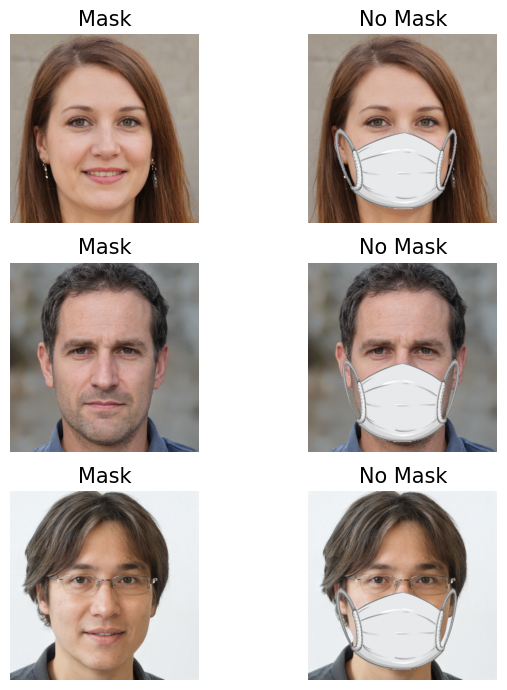

In [ ]:
number_sample = 3
fig, axes = plt.subplots(3, 2, figsize=(7, 7))
for i in range(number_sample):
    # Display mask
    axes[i, 0].imshow(mask_images[i])
    axes[i, 0].set_title("Mask", fontsize=15)
    axes[i, 0].axis('off')

    # Display image
    axes[i, 1].imshow(no_mask_images[i])
    axes[i, 1].set_title("No Mask", fontsize=15)
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

This function, `show_images_grid`, displays a grid of images in a specified number of rows and columns. It takes in a list of images and arranges them in a grid, turning off the axes for a cleaner presentation. The grid's size is determined by the number of rows and columns, with each image displayed in a subplot of the defined figure size.

In [ ]:
def show_images_grid(images, rows, cols):
    figsize = (3*cols, 3*rows)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i])
        ax.axis('off')

    plt.tight_layout()
    plt.show()

To achieve mask removal, we utilize the Stable Diffusion Inpainting Model, a state-of-the-art tool designed for image restoration and reconstruction tasks. This model specializes in filling in missing or occluded parts of an image, making it an ideal choice for removing facial masks. By treating the masked regions as areas to be "inpainted," the model can generate realistic and detailed reconstructions of the underlying facial features.

The Stable Diffusion Inpainting Pipeline is loaded using the `runwayml/stable-diffusion-inpainting` pretrained weights. It operates efficiently with mixed precision (`torch.float16`) and utilizes GPU acceleration (`cuda`) for faster computations.

The masked face image is input into the pipeline along with a binary mask indicating the region covered by the facial mask. The model processes the input, analyzing the surrounding context to generate plausible and realistic facial details in place of the masked region. The output is a fully reconstructed face image, free from the mask.

In [ ]:
pipe = StableDiffusionInpaintPipeline.from_pretrained("runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

safety_checker/config.json:   0%|          | 0.00/4.78k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


For the task of mask removal, we use a two-step approach combining UNet and the Stable Diffusion Inpainting Model, to deliver realistic results. In this tutorial, we focus on the inpainting step while leaving the implementation of the UNet model to you. With the knowledge gained from previous sections, such as the UNet tutorial, you should be able to complete this part independently.

**Step 1: Generating Binary Masks with UNet (To Be Implemented)**:

To remove a mask, we first need a binary mask indicating the area covered by the face mask. Since labeled data (`y_train`) is not available, we can generate it using a custom function (`get_mask`). This function compares masked and unmasked images to compute the difference, processes it to extract the mask region, and creates a binary mask.

Once the binary masks are generated, you can train a UNet model:

- Inputs: Masked images.

- Outputs: Binary masks created using the `get_mask` function.

After training, the UNet can predict the mask region for any input image, creating the binary mask needed for the next step.

**Step 2: Removing Masks with Stable Diffusion**:

After identifying the mask region:

- The masked face image is input into the pipeline along with a binary mask indicating the region covered by the facial mask.

- The model processes the input, analyzing the surrounding context to generate realistic facial details in place of the masked region.

- The output is a fully reconstructed face image, free from the mask.

By following this approach, you can achieve robust mask removal, combining the precision of UNet for mask detection and the powerful reconstruction capabilities of the Stable Diffusion Inpainting Model.

The `get_mask` function generates binary masks (`y_train`) by comparing a masked image (`with_mask`) with its unmasked counterpart (`without_mask`). It computes the absolute pixel difference to highlight the mask region, converts it to grayscale, and applies thresholding to create a binary mask. White areas in the mask indicate the mask region, while black areas represent the rest of the face. This binary mask is then used as ground truth for training the UNet model to detect mask regions.

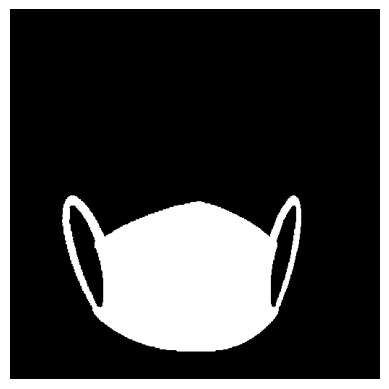

In [ ]:
def get_mask(with_mask, without_mask):
    difference = np.abs(without_mask - with_mask)
    gray_difference = cv2.cvtColor(difference, cv2.COLOR_BGR2GRAY)

    threshold_value = 0.01
    _, mask_image = cv2.threshold(gray_difference, threshold_value, 1, cv2.THRESH_BINARY)
    mask_image = mask_image.astype(np.uint8)
    mask_image = mask_image * 255
    mask_image = Image.fromarray(mask_image)

    return mask
777777
with_mask = mask_images[0]
without_mask = no_mask_images[0]
mask_image = get_mask(with_mask, without_mask)

plt.imshow(mask_image, cmap='gray')
plt.axis('off')
plt.show()

This code performs facial mask removal using the Stable Diffusion Inpainting Model from `runwayml/stable-diffusion-inpainting`. It takes an image of a masked face (`init_image`) and a corresponding mask (`mask_image`) generated using the `get_mask` function. The model then processes the image with a custom prompt to reconstruct the face, removing the mask and restoring realistic facial features.

The input image is paired with a binary mask to guide the inpainting process, while the negative prompt ensures the model avoids generating undesired artifacts. The result is a mask-free image that closely resembles the original, unmasked face.

After processing the images, we use the `show_images_grid` function to display a comparison of the original, masked, and reconstructed images. The grid includes the masked image (`init_image`), the binary mask (`mask_image`) that highlights the mask area, the original unmasked image (`without_mask_image`), and the output images generated by the diffusion model with the mask removed, allowing for a clear side-by-side comparison of the results.

  0%|          | 0/50 [00:00<?, ?it/s]

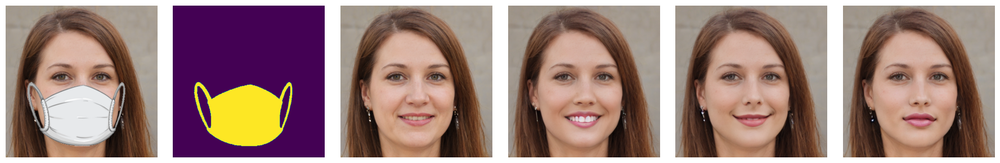

In [ ]:
init_image = mask_images[0]
without_mask_image = no_mask_images[0]
mask_image = get_mask(init_image, without_mask_image)
number_of_images = 3

prompt = ["a realistic, clear face with natural skin tone, eyes, nose, and mouth"] * number_of_images
negative_prompt = ["ugly, deformed, disfigured, poor details, mask"] * number_of_images
output_images = pipe(prompt=prompt, negative_prompt = negative_prompt, image=init_image, mask_image=mask_image)

all_images = [init_image, mask_image, without_mask_image]
all_images.extend(output_images[0])
show_images_grid(all_images, rows=1, cols=6)

  0%|          | 0/50 [00:00<?, ?it/s]

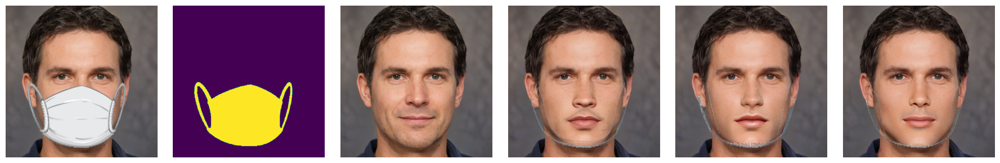

In [ ]:
init_image = mask_images[20]
without_mask_image = no_mask_images[20]
mask_image = get_mask(init_image, without_mask_image)
number_of_images = 3

prompt = ["a realistic, clear face with natural skin tone, eyes, nose, and mouth"] * number_of_images
negative_prompt = ["ugly, deformed, disfigured, poor details, mask"] * number_of_images
output_images = pipe(prompt=prompt, negative_prompt = negative_prompt, image=init_image, mask_image=mask_image)

all_images = [init_image, mask_image, without_mask_image]
all_images.extend(output_images[0])
show_images_grid(all_images, rows=1, cols=6)

  0%|          | 0/50 [00:00<?, ?it/s]

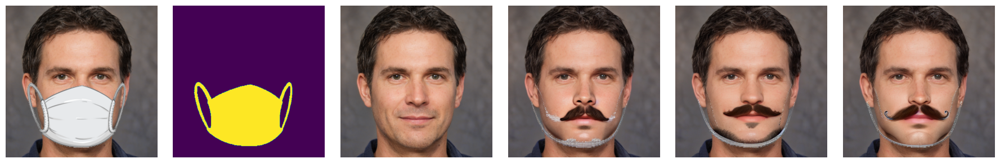

In [ ]:
init_image = mask_images[20]
without_mask_image = no_mask_images[20]
mask_image = get_mask(init_image, without_mask_image)
number_of_images = 3

prompt = ["a realistic, clear face with natural skin tone, eyes, nose, and mouth and small amount of beard and mustache"] * number_of_images
negative_prompt = ["ugly, deformed, disfigured, poor details, mask"] * number_of_images
output_images = pipe(prompt=prompt, negative_prompt = negative_prompt, image=init_image, mask_image=mask_image)

all_images = [init_image, mask_image, without_mask_image]
all_images.extend(output_images[0])
show_images_grid(all_images, rows=1, cols=6)

  0%|          | 0/50 [00:00<?, ?it/s]

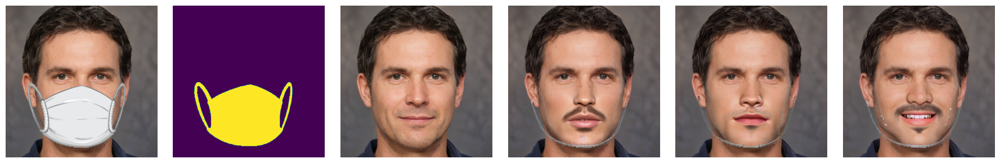

In [ ]:
init_image = mask_images[20]
without_mask_image = no_mask_images[20]
mask_image = get_mask(init_image, without_mask_image)
number_of_images = 3

prompt = ["a realistic, clear face with natural skin tone, eyes, nose, and mouth and beard"] * number_of_images
negative_prompt = ["ugly, deformed, disfigured, poor details, mask"] * number_of_images
output_images = pipe(prompt=prompt, negative_prompt = negative_prompt, image=init_image, mask_image=mask_image)

all_images = [init_image, mask_image, without_mask_image]
all_images.extend(output_images[0])
show_images_grid(all_images, rows=1, cols=6)

  0%|          | 0/50 [00:00<?, ?it/s]

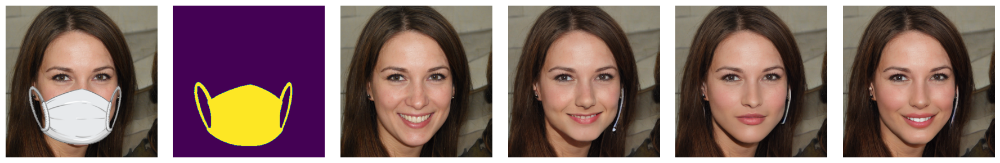

In [ ]:
init_image = mask_images[10]
without_mask_image = no_mask_images[10]
mask_image = get_mask(init_image, without_mask_image)
number_of_images = 3

prompt = ["a realistic, clear face with natural skin tone, eyes, nose, and mouth and beard"] * number_of_images
negative_prompt = ["ugly, deformed, disfigured, poor details, mask"] * number_of_images
output_images = pipe(prompt=prompt, negative_prompt = negative_prompt, image=init_image, mask_image=mask_image)

all_images = [init_image, mask_image, without_mask_image]
all_images.extend(output_images[0])
show_images_grid(all_images, rows=1, cols=6)

<a id='references'></a>

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    References
</b> </h1>

- Autoencoders and U-Net:

    - https://www.tensorflow.org/tutorials/generative/autoencoder

    - https://medium.com/chat-gpt-now-writes-all-my-articles/introduction-to-all-types-of-autoencoders-with-python-ec0e47b5e1b9

    - https://mriquestions.com/upsampling.html

    - https://www.frontiersin.org/journals/aging-neuroscience/articles/10.3389/fnagi.2022.841297/full

- Diffusion:

    - https://lilianweng.github.io/posts/2021-07-11-diffusion-models/

    - https://encord.com/blog/diffusion-models/

    - https://tree.rocks/make-diffusion-model-from-scratch-easy-way-to-implement-quick-diffusion-model-e60d18fd0f2e